# 3. Earthquakes dataset with kMeans Clustering

---
### Loading the libraries

In [1]:
import numpy as np
import random
import copy
import tqdm

import plotly.express as px
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.model_selection import ParameterGrid

from plyfile import PlyData

RANDOM_STATE=42
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

import warnings
warnings.filterwarnings('ignore')

---
### Read the Dataset

In [2]:
ply_data =PlyData.read('earthquakes.ply')

In [3]:
x = ply_data.elements[0].data['x']
y = ply_data.elements[0].data['y']
z = ply_data.elements[0].data['z']

x = x.reshape(-1, 1)
y = y.reshape(-1, 1)
z = z.reshape(-1, 1)

data = np.concatenate((x,y,z), axis=-1)
np.random.shuffle(data)

In [4]:
org_data = copy.copy(data)

---
### Sampling the data

In [5]:
def sample_data(in_data: np.array, reduction_factor: int) -> np.array:
    total_rows = data.shape[0]
    row_ids = np.random.choice(total_rows, total_rows // reduction_factor, replace=False)
    ret_data = in_data[row_ids]
    return ret_data

In [6]:
print('Original Dataset shape: ', org_data.shape)

sample = 8
data = sample_data(org_data, sample)
print(f'1/{sample} Sample Dataset:      {data.shape}')

x = data[:,0]
y = data[:,1]
z = data[:,2]

print('Shape of x:             ', x.shape)
print('Shape of y:             ', y.shape)
print('Shape of z:             ', z.shape)

Original Dataset shape:  (521721, 3)
1/8 Sample Dataset:      (65215, 3)
Shape of x:              (65215,)
Shape of y:              (65215,)
Shape of z:              (65215,)


---
### Estimation of the numbers of clusters in K-means with Elbow Method

  File "C:\ProgramData\anaconda3\lib\site-packages\joblib\externals\loky\backend\context.py", line 245, in _count_physical_cores
    raise ValueError(


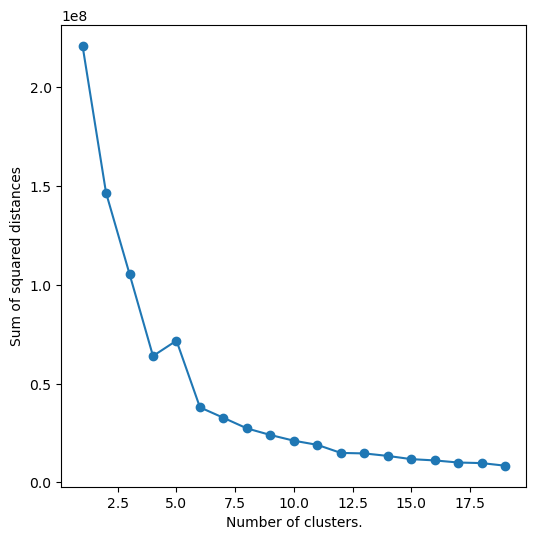

In [7]:
list_k = range(1, 20)
list_ssd = []
for k in list_k:
    km = KMeans(n_clusters=k, n_init='auto')
    km.fit(data)
    list_ssd.append(km.inertia_)
plt.figure(figsize=(6,6))
plt.plot(list_k, list_ssd, '-o')
plt.xlabel("Number of clusters.")
plt.ylabel("Sum of squared distances")
plt.show()

### CONCLUSION:     
The **Elbow method** shows that sum of square distances stops dropping rapidly around 6-15, showing that the optimal number of clusters is somewhere in this interval.

---
### Metric for evaluating the quality of clustering - Silhouette score 

In [8]:
def sil_eval(model, parameter_grid, data: np.array) -> tuple:
    best_score = -1
    best_grid = None
    n_labs = 0

    for params in tqdm.tqdm(parameter_grid):
        model.set_params(**params)
        model.fit(data)
        n_unique_labels = len(np.unique(model.labels_))
        if n_unique_labels == 1:
            continue
        current_score = silhouette_score(data, model.labels_)
        if current_score > best_score:
            best_score = current_score
            best_grid = params
            n_labs = n_unique_labels
    return best_score, best_grid, n_labs

---
### kMeans model with grid parameters accorging to Elbow method

In [9]:
model_km = KMeans()

parameters = {
    'n_clusters': np.arange(6, 15, 1),
    'n_init': ['auto'], 
    'random_state': [RANDOM_STATE]
}
parameter_grid = ParameterGrid(parameters)
best_score, best_params, n_labs = sil_eval(model_km, parameter_grid, data)

print('Best Score:      ', best_score)
print('Best Parameters: ', best_params)
print('Number of Labels:', n_labs)

100%|██████████| 9/9 [14:21<00:00, 95.74s/it]

Best Score:       0.5779058
Best Parameters:  {'n_clusters': 14, 'n_init': 'auto', 'random_state': 42}
Number of Labels: 14


In [10]:
# Perform kMEans with number of clusters from elbow method

final_model_km = KMeans(n_clusters=best_params['n_clusters'], n_init=best_params['n_init'], random_state=RANDOM_STATE)
final_model_km.fit(data)
final_model_km_labels = final_model_km.labels_

In [11]:
fig = px.scatter_3d(x=x.flatten(), y=y.flatten(), z=z.flatten(), color=final_model_km_labels)
fig.update_traces(marker_size=1)
fig.show()

---
# RESULTS:

### kMeans model with grid parameters accorging to Elbow method    

In general Silhouette score is satisfying for kMeans, since we didn't expect that it would cluster the data properly, beacause kMeans can't fit irregular cluster patterns.    

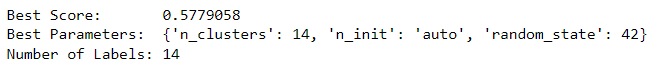
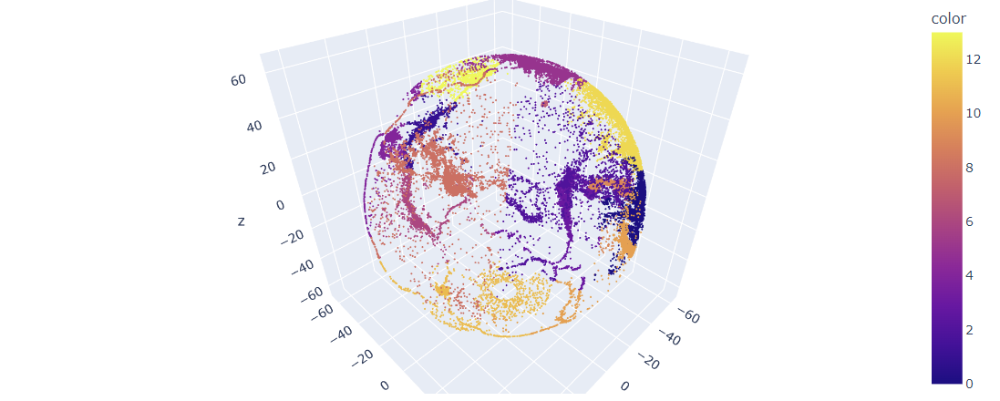